<a href="https://colab.research.google.com/github/Devanshu0502/Time-Series/blob/main/Time%20Series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import os
import gc
import warnings

import statsmodels.api as sm

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

In [ ]:
# Import
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
stores = pd.read_csv("stores.csv")
transactions = pd.read_csv("transactions.csv").sort_values(["store_nbr", "date"])


# Datetime
train["date"] = pd.to_datetime(train.date)
test["date"] = pd.to_datetime(test.date)
transactions["date"] = pd.to_datetime(transactions.date)

# Data types
train.onpromotion = train.onpromotion.astype("float16")
train.sales = train.sales.astype("float32")
stores.cluster = stores.cluster.astype("int8")

train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00
1,1,2013-01-01,1,BABY CARE,0.00,0.00
2,2,2013-01-01,1,BEAUTY,0.00,0.00
3,3,2013-01-01,1,BEVERAGES,0.00,0.00
4,4,2013-01-01,1,BOOKS,0.00,0.00


In [ ]:
transactions.head(10)

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520
231,2013-01-07,1,1807
277,2013-01-08,1,1869
323,2013-01-09,1,1910
369,2013-01-10,1,1679
415,2013-01-11,1,1813


In [ ]:
temp = pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), transactions, how = "left")
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))
px.line(transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )

Spearman Correlation between Total Sales and Transactions: 0.8175


In [ ]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
px.box(a, x="year", y="transactions" , color = "month", title = "Transactions")

In [ ]:
a = transactions.set_index("date").resample("M").transactions.mean().reset_index()
a["year"] = a.date.dt.year
px.line(a, x='date', y='transactions', color='year',title = "Monthly Average Transactions" )

In [ ]:
px.scatter(temp, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = "red")

In [ ]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
px.line(a, x="dayofweek", y="transactions" , color = "year", title = "Transactions")

In [ ]:
# Import 
oil = pd.read_csv("oil.csv")
oil["date"] = pd.to_datetime(oil.date)
# Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()
# Plot
p = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )

Correlation with Daily Oil Prices
sales          -0.30
transactions    0.04
Name: dcoilwtico_interpolated, dtype: float64 



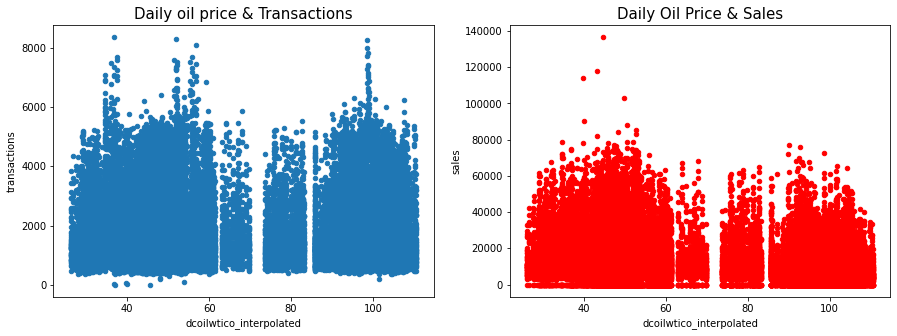

In [ ]:
temp = pd.merge(temp, oil, how = "left")
print("Correlation with Daily Oil Prices")
print(temp.drop(["store_nbr", "dcoilwtico"], axis = 1).corr("spearman").dcoilwtico_interpolated.loc[["sales", "transactions"]], "\n")


fig, axes = plt.subplots(1, 2, figsize = (15,5))
temp.plot.scatter(x = "dcoilwtico_interpolated", y = "transactions", ax=axes[0])
temp.plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1], color = "r")
axes[0].set_title('Daily oil price & Transactions', fontsize = 15)
axes[1].set_title('Daily Oil Price & Sales', fontsize = 15);

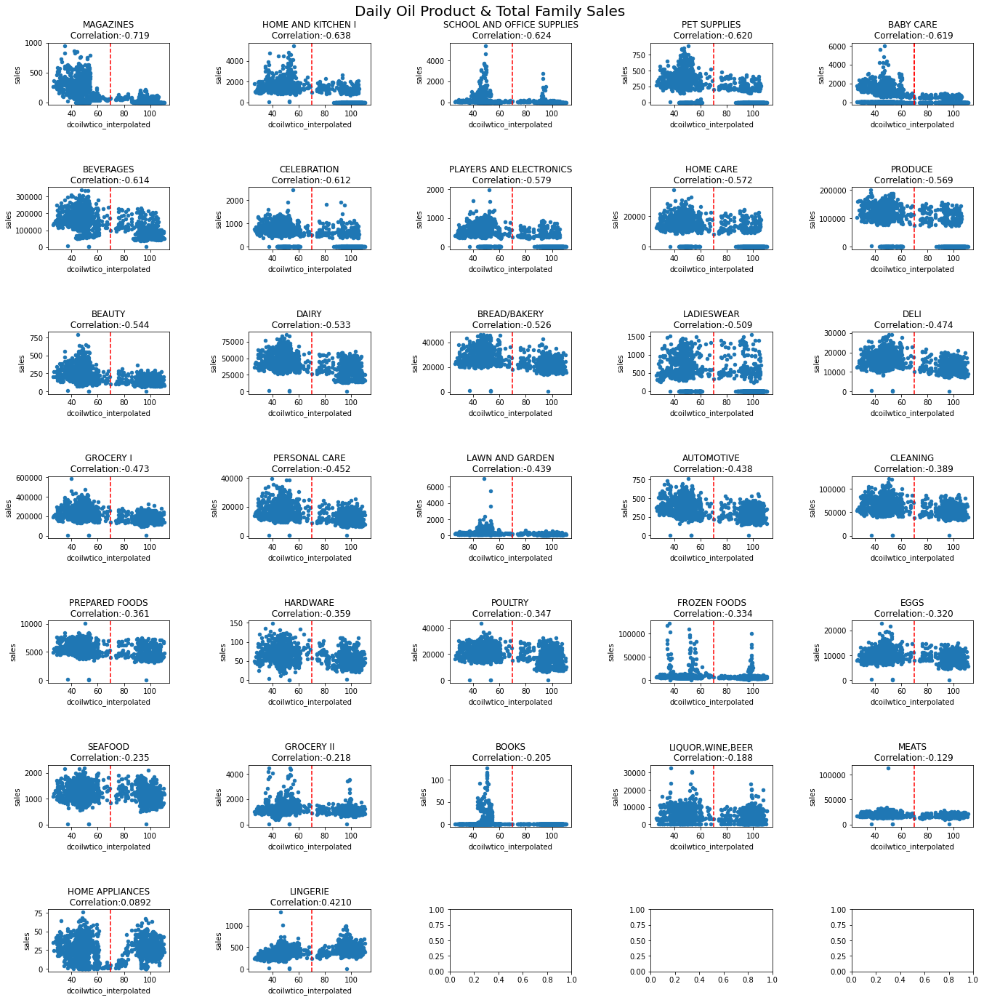

In [ ]:
a = pd.merge(train.groupby(["date", "family"]).sales.sum().reset_index(), oil.drop("dcoilwtico", axis = 1), how = "left")
c = a.groupby("family").corr("spearman").reset_index()
c = c[c.level_1 == "dcoilwtico_interpolated"][["family", "sales"]].sort_values("sales")

fig, axes = plt.subplots(7, 5, figsize = (20,20))
for i, fam in enumerate(c.family):
    if i < 6:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[0, i-1])
        axes[0, i-1].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[0, i-1].axvline(x=70, color='r', linestyle='--')
    if i >= 6 and i<11:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1, i-6])
        axes[1, i-6].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[1, i-6].axvline(x=70, color='r', linestyle='--')
    if i >= 11 and i<16:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[2, i-11])
        axes[2, i-11].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[2, i-11].axvline(x=70, color='r', linestyle='--')
    if i >= 16 and i<21:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[3, i-16])
        axes[3, i-16].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[3, i-16].axvline(x=70, color='r', linestyle='--')
    if i >= 21 and i<26:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[4, i-21])
        axes[4, i-21].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[4, i-21].axvline(x=70, color='r', linestyle='--')
    if i >= 26 and i < 31:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[5, i-26])
        axes[5, i-26].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[5, i-26].axvline(x=70, color='r', linestyle='--')
    if i >= 31 :
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[6, i-31])
        axes[6, i-31].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[6, i-31].axvline(x=70, color='r', linestyle='--')
        
        
plt.tight_layout(pad=5)
plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize = 20);
plt.show()

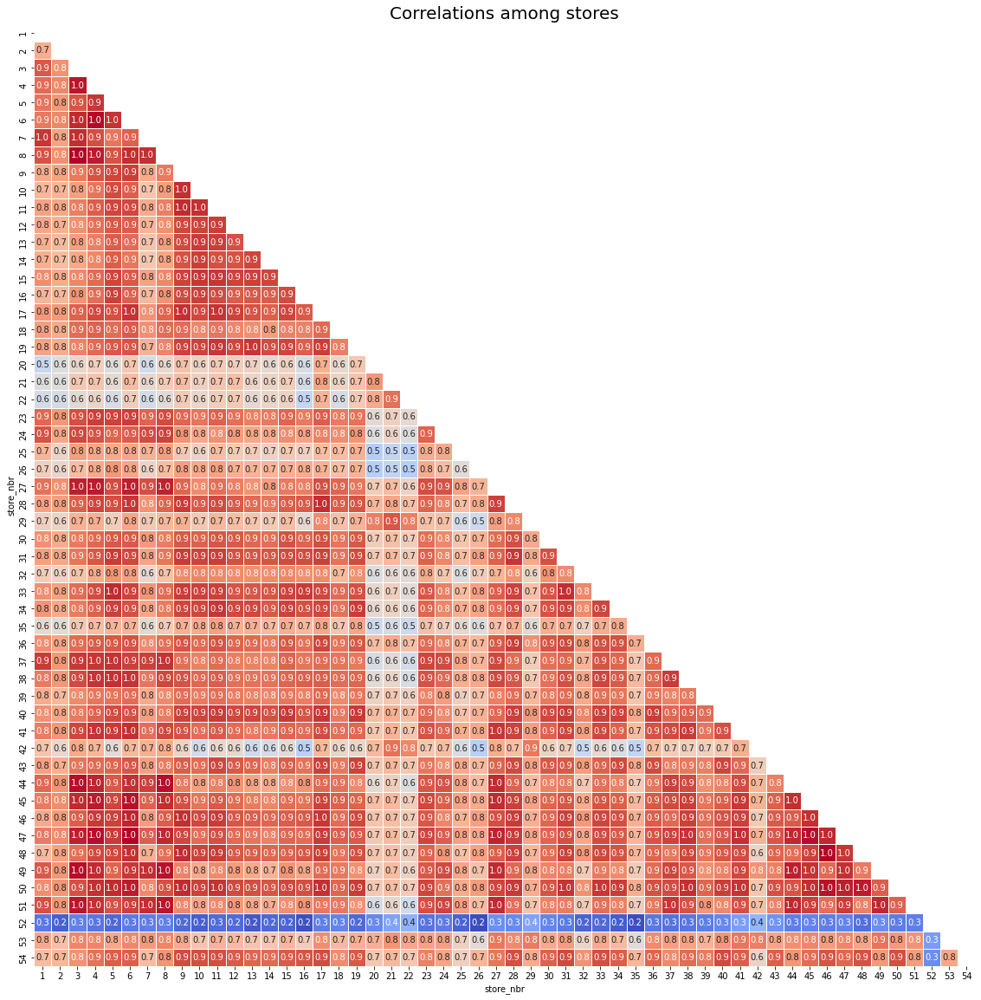

In [ ]:
a = train[["store_nbr", "sales"]]
a["ind"] = 1
a["ind"] = a.groupby("store_nbr").ind.cumsum().values
a = pd.pivot(a, index = "ind", columns = "store_nbr", values = "sales").corr()
mask = np.triu(a.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(a,
        annot=True,
        fmt='.1f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among stores",fontsize = 20)
plt.show()

In [ ]:
a = train.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores")

In [ ]:
print(train.shape)
train = train[~((train.store_nbr == 52) & (train.date < "2017-04-20"))]
train = train[~((train.store_nbr == 22) & (train.date < "2015-10-09"))]
train = train[~((train.store_nbr == 42) & (train.date < "2015-08-21"))]
train = train[~((train.store_nbr == 21) & (train.date < "2015-07-24"))]
train = train[~((train.store_nbr == 29) & (train.date < "2015-03-20"))]
train = train[~((train.store_nbr == 20) & (train.date < "2015-02-13"))]
train = train[~((train.store_nbr == 53) & (train.date < "2014-05-29"))]
train = train[~((train.store_nbr == 36) & (train.date < "2013-05-09"))]
train.shape

(3000888, 6)


(2780316, 6)

In [ ]:
c = train.groupby(["store_nbr", "family"]).sales.sum().reset_index().sort_values(["family","store_nbr"])
c = c[c.sales == 0]
c

,store_nbr,family,sales
1,1,BABY CARE,0.00
397,13,BABY CARE,0.00
727,23,BABY CARE,0.00
1420,44,BABY CARE,0.00
1453,45,BABY CARE,0.00
1486,46,BABY CARE,0.00
1519,47,BABY CARE,0.00
1552,48,BABY CARE,0.00
1585,49,BABY CARE,0.00
1618,50,BABY CARE,0.00


In [ ]:
zero_prediction = []
for i in range(0,len(c)):
    zero_prediction.append(
        pd.DataFrame({
            "date":pd.date_range("2017-08-16", "2017-08-31").tolist(),
            "store_nbr":c.store_nbr.iloc[i],
            "family":c.family.iloc[i],
            "sales":0
        })
    )
zero_prediction = pd.concat(zero_prediction)
del c
gc.collect()
zero_prediction

,date,store_nbr,family,sales
0,2017-08-16,1,BABY CARE,0
1,2017-08-17,1,BABY CARE,0
2,2017-08-18,1,BABY CARE,0
3,2017-08-19,1,BABY CARE,0
4,2017-08-20,1,BABY CARE,0
...,...,...,...,...
11,2017-08-27,54,LAWN AND GARDEN,0
12,2017-08-28,54,LAWN AND GARDEN,0
13,2017-08-29,54,LAWN AND GARDEN,0
14,2017-08-30,54,LAWN AND GARDEN,0


In [ ]:
c = train.groupby(["family", "store_nbr"]).tail(60).groupby(["family", "store_nbr"]).sales.sum().reset_index()
c[c.sales == 0]

,family,store_nbr,sales
54,BABY CARE,1,0.00
55,BABY CARE,2,0.00
63,BABY CARE,10,0.00
65,BABY CARE,12,0.00
66,BABY CARE,13,0.00
...,...,...,...
1697,SCHOOL AND OFFICE SUPPLIES,24,0.00
1705,SCHOOL AND OFFICE SUPPLIES,32,0.00
1706,SCHOOL AND OFFICE SUPPLIES,33,0.00
1713,SCHOOL AND OFFICE SUPPLIES,40,0.00


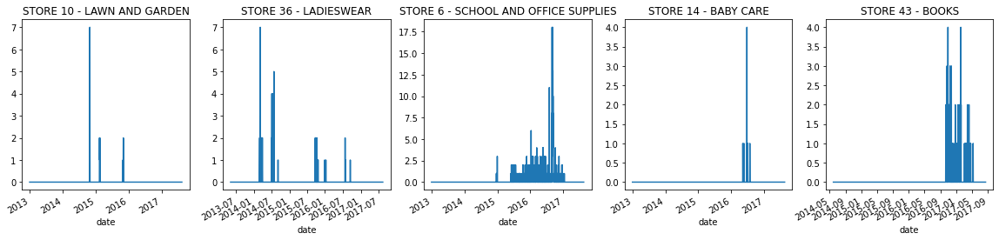

In [ ]:
fig, ax = plt.subplots(1,5, figsize = (20,4))
train[(train.store_nbr == 10) & (train.family == "LAWN AND GARDEN")].set_index("date").sales.plot(ax = ax[0], title = "STORE 10 - LAWN AND GARDEN")
train[(train.store_nbr == 36) & (train.family == "LADIESWEAR")].set_index("date").sales.plot(ax = ax[1], title = "STORE 36 - LADIESWEAR")
train[(train.store_nbr == 6) & (train.family == "SCHOOL AND OFFICE SUPPLIES")].set_index("date").sales.plot(ax = ax[2], title = "STORE 6 - SCHOOL AND OFFICE SUPPLIES")
train[(train.store_nbr == 14) & (train.family == "BABY CARE")].set_index("date").sales.plot(ax = ax[3], title = "STORE 14 - BABY CARE")
train[(train.store_nbr == 53) & (train.family == "BOOKS")].set_index("date").sales.plot(ax = ax[4], title = "STORE 43 - BOOKS")
plt.show()

In [ ]:
a = train.set_index("date").groupby("family").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "family", title = "Daily total sales of the family")

In [ ]:
a = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(a, y = "family", x="sales", color = "family", title = "Which product family preferred more?")

In [ ]:
print("Spearman Correlation between Sales and Onpromotion: {:,.4f}".format(train.corr("spearman").sales.loc["onpromotion"]))

Spearman Correlation between Sales and Onpromotion: 0.5329


In [ ]:
d = pd.merge(train, stores)
d["store_nbr"] = d["store_nbr"].astype("int8")
d["year"] = d.date.dt.year
px.line(d.groupby(["city", "year"]).sales.mean().reset_index(), x = "year", y = "sales", color = "city")

In [ ]:
holidays = pd.read_csv("holidays_events.csv")
holidays["date"] = pd.to_datetime(holidays.date)

# holidays[holidays.type == "Holiday"]
# holidays[(holidays.type == "Holiday") & (holidays.transferred == True)]

# Transferred Holidays
tr1 = holidays[(holidays.type == "Holiday") & (holidays.transferred == True)].drop("transferred", axis = 1).reset_index(drop = True)
tr2 = holidays[(holidays.type == "Transfer")].drop("transferred", axis = 1).reset_index(drop = True)
tr = pd.concat([tr1,tr2], axis = 1)
tr = tr.iloc[:, [5,1,2,3,4]]

holidays = holidays[(holidays.transferred == False) & (holidays.type != "Transfer")].drop("transferred", axis = 1)
holidays = holidays.append(tr).reset_index(drop = True)


# Additional Holidays
holidays["description"] = holidays["description"].str.replace("-", "").str.replace("+", "").str.replace('\d+', '')
holidays["type"] = np.where(holidays["type"] == "Additional", "Holiday", holidays["type"])

# Bridge Holidays
holidays["description"] = holidays["description"].str.replace("Puente ", "")
holidays["type"] = np.where(holidays["type"] == "Bridge", "Holiday", holidays["type"])

 
# Work Day Holidays, that is meant to payback the Bridge.
work_day = holidays[holidays.type == "Work Day"]  
holidays = holidays[holidays.type != "Work Day"]  


# Split

# Events are national
events = holidays[holidays.type == "Event"].drop(["type", "locale", "locale_name"], axis = 1).rename({"description":"events"}, axis = 1)

holidays = holidays[holidays.type != "Event"].drop("type", axis = 1)
regional = holidays[holidays.locale == "Regional"].rename({"locale_name":"state", "description":"holiday_regional"}, axis = 1).drop("locale", axis = 1).drop_duplicates()
national = holidays[holidays.locale == "National"].rename({"description":"holiday_national"}, axis = 1).drop(["locale", "locale_name"], axis = 1).drop_duplicates()
local = holidays[holidays.locale == "Local"].rename({"description":"holiday_local", "locale_name":"city"}, axis = 1).drop("locale", axis = 1).drop_duplicates()



d = pd.merge(train.append(test), stores)
d["store_nbr"] = d["store_nbr"].astype("int8")


# National Holidays & Events
#d = pd.merge(d, events, how = "left")
d = pd.merge(d, national, how = "left")
# Regional
d = pd.merge(d, regional, how = "left", on = ["date", "state"])
# Local
d = pd.merge(d, local, how = "left", on = ["date", "city"])

# Work Day: It will be removed when real work day colum created
d = pd.merge(d,  work_day[["date", "type"]].rename({"type":"IsWorkDay"}, axis = 1),how = "left")

# EVENTS
events["events"] =np.where(events.events.str.contains("futbol"), "Futbol", events.events)

def one_hot_encoder(df, nan_as_category=True):
    original_columns = list(df.columns)
    categorical_columns = df.select_dtypes(["category", "object"]).columns.tolist()
    # categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    df.columns = df.columns.str.replace(" ", "_")
    return df, df.columns.tolist()

events, events_cat = one_hot_encoder(events, nan_as_category=False)
events["events_Dia_de_la_Madre"] = np.where(events.date == "2016-05-08", 1,events["events_Dia_de_la_Madre"])
events = events.drop(239)

d = pd.merge(d, events, how = "left")
d[events_cat] = d[events_cat].fillna(0)

# New features
d["holiday_national_binary"] = np.where(d.holiday_national.notnull(), 1, 0)
d["holiday_local_binary"] = np.where(d.holiday_local.notnull(), 1, 0)
d["holiday_regional_binary"] = np.where(d.holiday_regional.notnull(), 1, 0)

# 
d["national_independence"] = np.where(d.holiday_national.isin(['Batalla de Pichincha',  'Independencia de Cuenca', 'Independencia de Guayaquil', 'Independencia de Guayaquil', 'Primer Grito de Independencia']), 1, 0)
d["local_cantonizacio"] = np.where(d.holiday_local.str.contains("Cantonizacio"), 1, 0)
d["local_fundacion"] = np.where(d.holiday_local.str.contains("Fundacion"), 1, 0)
d["local_independencia"] = np.where(d.holiday_local.str.contains("Independencia"), 1, 0)


holidays, holidays_cat = one_hot_encoder(d[["holiday_national","holiday_regional","holiday_local"]], nan_as_category=False)
d = pd.concat([d.drop(["holiday_national","holiday_regional","holiday_local"], axis = 1),holidays], axis = 1)

he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
d[he_cols] = d[he_cols].astype("int8")

d[["family", "city", "state", "type"]] = d[["family", "city", "state", "type"]].astype("category")

del holidays, holidays_cat, work_day, local, regional, national, events, events_cat, tr, tr1, tr2, he_cols
gc.collect()

d.head(10)

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,IsWorkDay,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,2013-01-01,1,BABY CARE,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2,2013-01-01,1,BEAUTY,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,3,2013-01-01,1,BEVERAGES,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,4,2013-01-01,1,BOOKS,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,5,2013-01-01,1,BREAD/BAKERY,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,6,2013-01-01,1,CELEBRATION,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,7,2013-01-01,1,CLEANING,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,8,2013-01-01,1,DAIRY,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,9,2013-01-01,1,DELI,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
def AB_Test(dataframe, group, target):
    
    # Packages
    from scipy.stats import shapiro
    import scipy.stats as stats
    
    # Split A/B
    groupA = dataframe[dataframe[group] == 1][target]
    groupB = dataframe[dataframe[group] == 0][target]
    
    # Assumption: Normality
    ntA = shapiro(groupA)[1] < 0.05
    ntB = shapiro(groupB)[1] < 0.05
    # H0: Distribution is Normal! - False
    # H1: Distribution is not Normal! - True
    
    if (ntA == False) & (ntB == False): # "H0: Normal Distribution"
        # Parametric Test
        # Assumption: Homogeneity of variances
        leveneTest = stats.levene(groupA, groupB)[1] < 0.05
        # H0: Homogeneity: False
        # H1: Heterogeneous: True
        
        if leveneTest == False:
            # Homogeneity
            ttest = stats.ttest_ind(groupA, groupB, equal_var=True)[1]
            # H0: M1 == M2 - False
            # H1: M1 != M2 - True
        else:
            # Heterogeneous
            ttest = stats.ttest_ind(groupA, groupB, equal_var=False)[1]
            # H0: M1 == M2 - False
            # H1: M1 != M2 - True
    else:
        # Non-Parametric Test
        ttest = stats.mannwhitneyu(groupA, groupB)[1] 
        # H0: M1 == M2 - False
        # H1: M1 != M2 - True
        
    # Result
    temp = pd.DataFrame({
        "AB Hypothesis":[ttest < 0.05], 
        "p-value":[ttest]
    })
    temp["Test Type"] = np.where((ntA == False) & (ntB == False), "Parametric", "Non-Parametric")
    temp["AB Hypothesis"] = np.where(temp["AB Hypothesis"] == False, "Fail to Reject H0", "Reject H0")
    temp["Comment"] = np.where(temp["AB Hypothesis"] == "Fail to Reject H0", "A/B groups are similar!", "A/B groups are not similar!")
    temp["Feature"] = group
    temp["GroupA_mean"] = groupA.mean()
    temp["GroupB_mean"] = groupB.mean()
    temp["GroupA_median"] = groupA.median()
    temp["GroupB_median"] = groupB.median()
    
    # Columns
    if (ntA == False) & (ntB == False):
        temp["Homogeneity"] = np.where(leveneTest == False, "Yes", "No")
        temp = temp[["Feature","Test Type", "Homogeneity","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]
    else:
        temp = temp[["Feature","Test Type","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]
    
    # Print Hypothesis
    # print("# A/B Testing Hypothesis")
    # print("H0: A == B")
    # print("H1: A != B", "\n")
    
    return temp
    
# Apply A/B Testing
he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
ab = []
for i in he_cols:
    ab.append(AB_Test(dataframe=d[d.sales.notnull()], group = i, target = "sales"))
ab = pd.concat(ab)
ab

,Feature,Test Type,AB Hypothesis,p-value,Comment,GroupA_mean,GroupB_mean,GroupA_median,GroupB_median
0,events_Black_Friday,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,382.24,386.17,23.00,16.00
0,events_Cyber_Monday,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,458.88,386.03,21.00,16.00
0,events_Dia_de_la_Madre,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,374.92,386.19,14.00,16.00
0,events_Futbol,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,349.84,386.45,11.00,16.00
0,events_Terremoto_Manabi,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,504.24,383.81,25.00,16.00
0,holiday_national_binary,Non-Parametric,Reject H0,0.01,A/B groups are not similar!,457.58,382.69,17.00,16.00
0,holiday_local_binary,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,458.99,385.87,21.00,16.00
0,holiday_regional_binary,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,245.57,386.21,9.00,16.00
0,holiday_national_Batalla_de_Pichincha,Non-Parametric,Fail to Reject H0,0.72,A/B groups are similar!,421.38,386.05,18.00,16.00
0,holiday_national_Carnaval,Non-Parametric,Fail to Reject H0,0.22,A/B groups are similar!,362.41,386.30,16.00,16.00


In [ ]:
d.groupby(["family","events_Futbol"]).sales.mean()[:60]

family                   events_Futbol
AUTOMOTIVE               0                  6.59
                         1                  6.20
BABY CARE                0                  0.12
                         1                  0.07
BEAUTY                   0                  4.02
                         1                  2.89
BEVERAGES                0               2577.73
                         1               2243.45
BOOKS                    0                  0.08
                         1                  0.00
BREAD/BAKERY             0                500.48
                         1                451.53
CELEBRATION              0                  9.06
                         1                  6.43
CLEANING                 0               1157.94
                         1               1102.08
DAIRY                    0                765.46
                         1                759.26
DELI                     0                286.35
                         1    

In [ ]:
# Time Related Features
def create_date_features(df):
    df['month'] = df.date.dt.month.astype("int8")
    df['day_of_month'] = df.date.dt.day.astype("int8")
    df['day_of_year'] = df.date.dt.dayofyear.astype("int16")
    df['week_of_month'] = (df.date.apply(lambda d: (d.day-1) // 7 + 1)).astype("int8")
    df['week_of_year'] = (df.date.dt.weekofyear).astype("int8")
    df['day_of_week'] = (df.date.dt.dayofweek + 1).astype("int8")
    df['year'] = df.date.dt.year.astype("int32")
    df["is_wknd"] = (df.date.dt.weekday // 4).astype("int8")
    df["quarter"] = df.date.dt.quarter.astype("int8")
    df['is_month_start'] = df.date.dt.is_month_start.astype("int8")
    df['is_month_end'] = df.date.dt.is_month_end.astype("int8")
    df['is_quarter_start'] = df.date.dt.is_quarter_start.astype("int8")
    df['is_quarter_end'] = df.date.dt.is_quarter_end.astype("int8")
    df['is_year_start'] = df.date.dt.is_year_start.astype("int8")
    df['is_year_end'] = df.date.dt.is_year_end.astype("int8")
    # 0: Winter - 1: Spring - 2: Summer - 3: Fall
    df["season"] = np.where(df.month.isin([12,1,2]), 0, 1)
    df["season"] = np.where(df.month.isin([6,7,8]), 2, df["season"])
    df["season"] = pd.Series(np.where(df.month.isin([9, 10, 11]), 3, df["season"])).astype("int8")
    return df
d = create_date_features(d)




# Workday column
d["workday"] = np.where((d.holiday_national_binary == 1) | (d.holiday_local_binary==1) | (d.holiday_regional_binary==1) | (d['day_of_week'].isin([6,7])), 0, 1)
d["workday"] = pd.Series(np.where(d.IsWorkDay.notnull(), 1, d["workday"])).astype("int8")
d.drop("IsWorkDay", axis = 1, inplace = True)

# Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. 
# Supermarket sales could be affected by this.
d["wageday"] = pd.Series(np.where((d['is_month_end'] == 1) | (d["day_of_month"] == 15), 1, 0)).astype("int8")

d.head(15)

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga,month,day_of_month,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
1,1,2013-01-01,1,BABY CARE,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
2,2,2013-01-01,1,BEAUTY,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
3,3,2013-01-01,1,BEVERAGES,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
4,4,2013-01-01,1,BOOKS,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
5,5,2013-01-01,1,BREAD/BAKERY,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
6,6,2013-01-01,1,CELEBRATION,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
7,7,2013-01-01,1,CLEANING,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
8,8,2013-01-01,1,DAIRY,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
9,9,2013-01-01,1,DELI,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0


In [ ]:
d[(d.month.isin([4,5]))].groupby(["year"]).sales.mean()

year
2013   241.99
2014   277.07
2015   324.74
2016   475.61
2017   488.62
Name: sales, dtype: float32

In [ ]:
pd.pivot_table(d[(d.month.isin([3]))], index="year", columns="family", values="sales", aggfunc="mean")

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013,5.35,0.00,2.74,1277.85,0.00,416.57,0.00,1055.67,429.53,229.49,157.80,95.06,3281.80,20.69,1.11,0.00,0.00,0.80,0.00,0.00,3.09,9.33,74.50,0.00,368.54,223.88,0.00,0.00,223.56,106.08,2.83,0.00,28.10
2014,6.94,0.05,3.55,3040.63,0.00,446.92,14.74,1215.01,815.26,261.29,189.67,138.42,3807.03,21.25,1.50,23.82,12.52,0.71,297.74,13.46,5.27,8.49,95.85,1.34,382.59,265.75,5.50,11.02,449.17,112.42,2300.86,1.53,27.45
2015,7.55,0.00,2.78,1515.37,0.00,547.43,0.00,1219.26,806.57,329.61,209.24,129.68,4016.91,23.82,1.13,24.85,18.66,0.85,0.00,0.00,5.03,6.52,91.09,0.00,356.97,316.62,0.00,0.00,420.88,104.59,4.51,0.00,28.61
2016,7.34,0.27,4.34,3023.50,0.00,501.95,14.23,1077.72,859.32,277.81,177.58,131.25,4088.61,19.78,1.32,26.11,25.67,0.31,267.45,11.26,5.04,4.92,89.79,6.07,330.77,296.47,5.89,8.72,374.97,109.86,2304.82,1.96,23.89
2017,7.79,0.27,4.29,3733.14,0.29,584.24,14.21,1220.11,991.14,326.49,199.83,130.17,4800.77,22.14,1.45,29.23,29.95,0.71,319.10,11.96,15.06,6.88,89.70,6.28,374.28,331.43,8.79,11.39,395.35,114.03,2442.19,5.02,25.54


In [ ]:
pd.pivot_table(d[(d.month.isin([4,5]))], index="year", columns="family", values="sales", aggfunc="mean")

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013,5.84,0.00,2.61,1260.96,0.00,418.76,0.00,1027.76,408.36,234.52,154.75,104.79,3308.63,21.95,1.01,0.00,0.00,0.75,0.00,0.00,3.02,9.39,71.10,0.00,377.75,224.65,0.00,0.00,221.59,96.68,5.35,0.00,25.37
2014,5.75,0.00,2.61,1461.64,0.00,416.34,0.00,1028.08,766.63,253.55,184.63,121.35,3614.11,21.44,1.02,0.00,0.00,0.56,0.00,0.00,4.67,8.94,85.83,0.00,361.61,266.44,0.00,0.00,405.27,103.47,5.66,0.00,23.63
2015,6.02,0.00,2.96,1915.16,0.00,551.60,0.00,1227.91,811.31,329.80,198.89,139.64,3989.90,26.46,1.06,26.11,20.73,0.65,127.72,0.00,5.14,8.20,95.21,1.69,365.24,314.39,0.06,0.00,415.49,102.44,5.68,0.00,27.05
2016,7.26,0.25,4.87,3369.27,0.00,551.90,14.25,1218.35,911.86,299.28,186.11,135.95,4898.71,22.04,1.36,27.10,28.28,0.45,315.92,12.14,5.16,6.24,82.89,6.77,363.50,363.47,6.84,10.67,399.37,108.67,2305.70,5.99,24.55
2017,7.63,0.18,5.30,3592.94,0.13,557.84,13.72,1308.01,970.85,323.21,202.54,138.61,4841.85,26.12,1.55,30.31,31.31,0.71,304.85,12.53,18.10,7.83,90.16,6.87,362.41,326.00,9.07,12.22,385.39,96.31,2404.91,11.71,23.17


In [ ]:
pd.pivot_table(d[(d.month.isin([6]))], index="year", columns="family", values="sales", aggfunc="mean")

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013,5.89,0.00,2.72,1297.24,0.00,431.05,0.00,1052.44,419.08,238.23,156.45,120.79,3489.13,21.83,0.95,0.00,0.00,0.71,0.00,0.00,3.21,8.85,75.67,0.00,389.95,216.12,0.00,0.00,232.16,100.72,6.12,0.00,20.99
2014,5.72,0.00,2.46,1458.94,0.00,450.82,0.00,1029.45,757.82,260.01,182.69,122.18,3655.15,22.99,1.03,0.00,0.00,0.41,0.00,0.00,4.08,8.60,94.37,0.00,383.37,270.10,0.00,0.00,409.03,101.04,5.75,0.00,23.97
2015,6.52,0.14,3.79,3178.15,0.00,549.95,14.74,1177.30,829.06,328.15,196.27,139.39,3903.51,25.12,1.30,26.92,31.28,0.12,288.21,13.51,4.96,7.83,101.28,1.53,376.68,297.36,5.87,8.72,411.02,108.23,2346.14,1.33,25.85
2016,6.25,0.27,4.55,2806.97,0.00,550.81,13.96,1108.43,863.92,280.66,182.98,129.32,4170.43,21.84,1.08,28.62,25.08,0.29,260.83,11.41,5.34,4.43,85.12,5.67,350.66,292.74,5.95,8.50,373.23,104.96,2239.03,1.55,23.18
2017,7.38,0.18,5.43,3580.13,0.04,555.64,13.80,1228.70,932.53,317.70,202.11,137.49,4702.43,29.26,1.40,33.93,30.85,0.64,286.55,11.93,16.86,6.78,95.40,6.19,388.38,319.44,9.22,11.34,406.58,90.90,2403.45,1.58,19.36


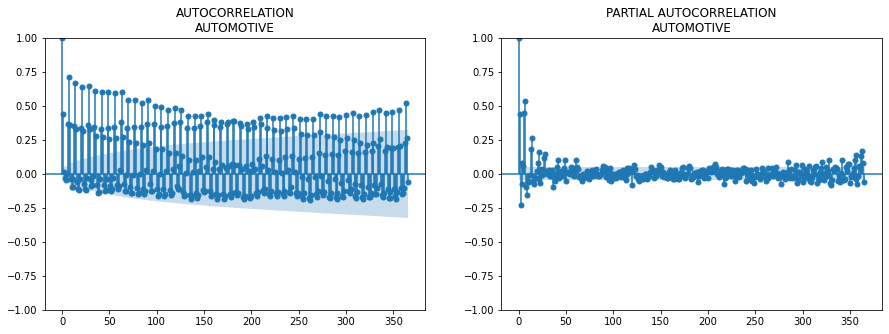

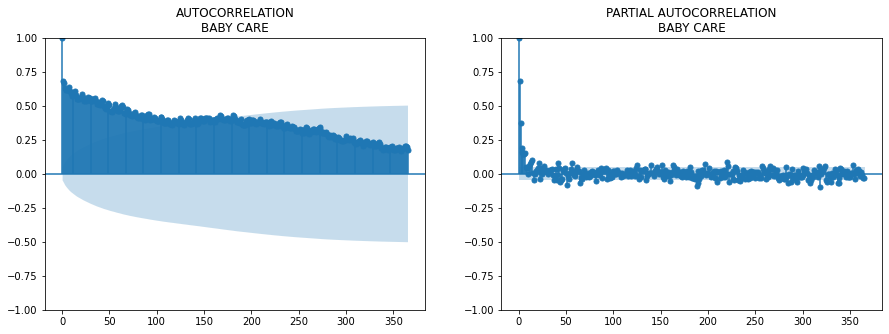

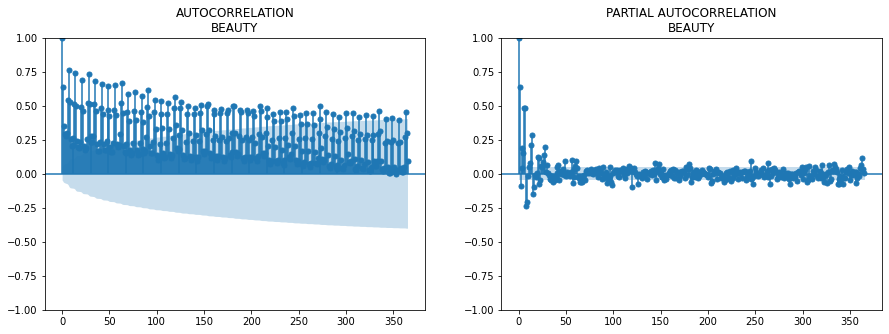

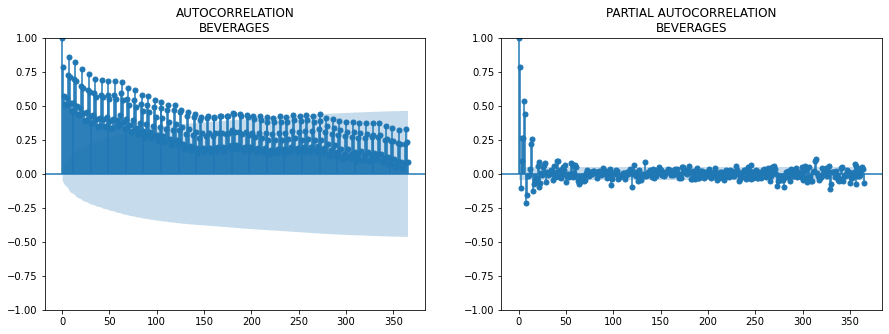

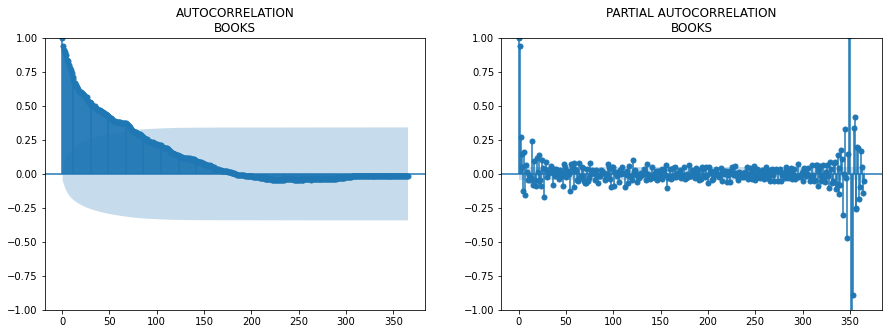

...

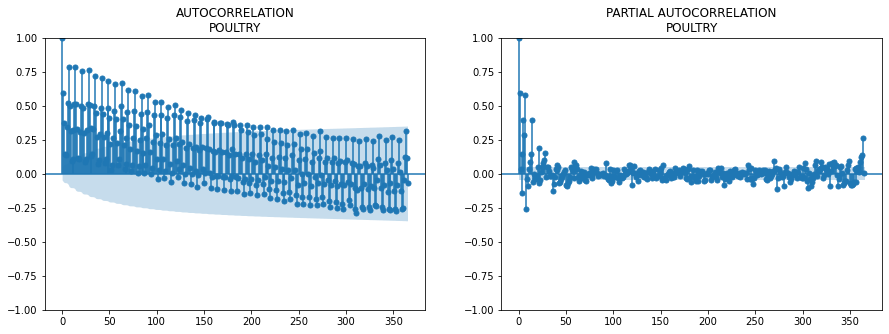

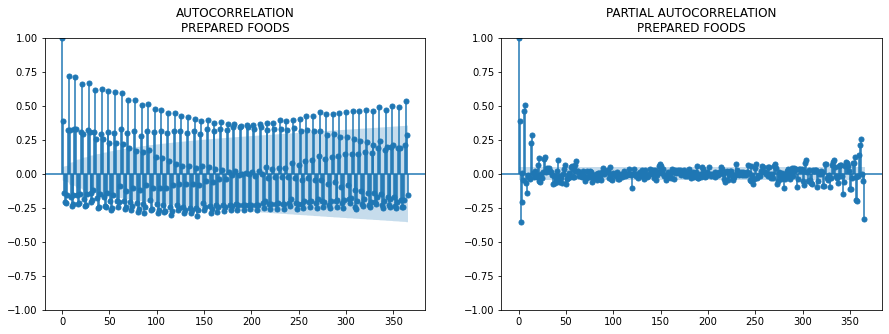

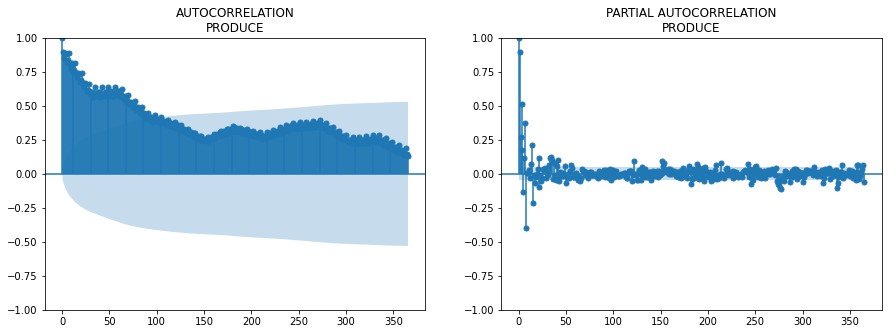

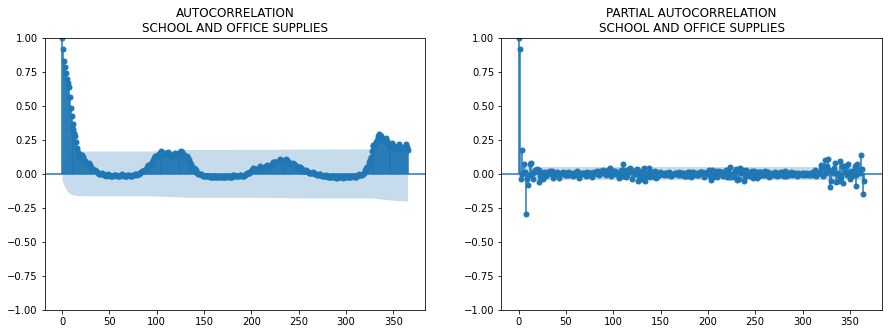

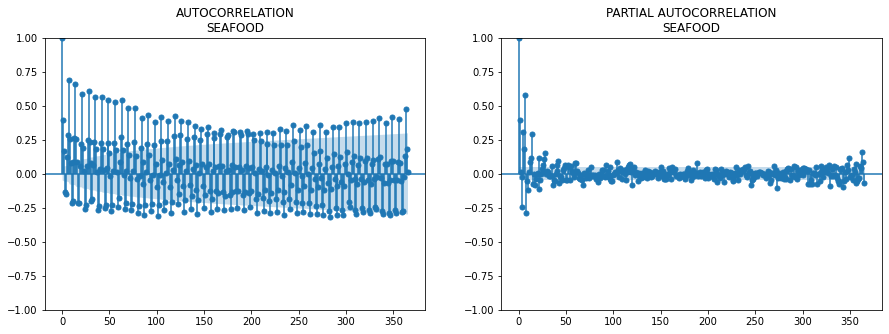

In [ ]:
#a = d[d["store_nbr"]==1].set_index("date")
a = d[(d.sales.notnull())].groupby(["date", "family"]).sales.mean().reset_index().set_index("date")
for num, i in enumerate(a.family.unique()):
    try:
        fig, ax = plt.subplots(1,2,figsize=(15,5))
        temp = a[(a.family == i)]#& (a.sales.notnull())
        sm.graphics.tsa.plot_acf(temp.sales, lags=365, ax=ax[0], title = "AUTOCORRELATION\n" + i)
        sm.graphics.tsa.plot_pacf(temp.sales, lags=365, ax=ax[1], title = "PARTIAL AUTOCORRELATION\n" + i)
    except:
        pass

In [ ]:
a = d[d.year.isin([2016,2017])].groupby(["year", "day_of_year"]).sales.mean().reset_index()
px.line(a, x = "day_of_year", y = "sales", color = "year", title = "Average sales for 2016 and 2017")

In [ ]:
a = train.sort_values(["store_nbr", "family", "date"])
for i in [20, 30, 45, 60, 90, 120, 365, 730]:
    a["SMA"+str(i)+"_sales_lag16"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(16).values
    a["SMA"+str(i)+"_sales_lag30"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(30).values
    a["SMA"+str(i)+"_sales_lag60"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(60).values
print("Correlation")
a[["sales"]+a.columns[a.columns.str.startswith("SMA")].tolist()].corr()

Correlation


,sales,SMA20_sales_lag16,SMA20_sales_lag30,SMA20_sales_lag60,SMA30_sales_lag16,SMA30_sales_lag30,SMA30_sales_lag60,SMA45_sales_lag16,SMA45_sales_lag30,SMA45_sales_lag60,SMA60_sales_lag16,SMA60_sales_lag30,SMA60_sales_lag60,SMA90_sales_lag16,SMA90_sales_lag30,SMA90_sales_lag60,SMA120_sales_lag16,SMA120_sales_lag30,SMA120_sales_lag60,SMA365_sales_lag16,SMA365_sales_lag30,SMA365_sales_lag60,SMA730_sales_lag16,SMA730_sales_lag30,SMA730_sales_lag60
sales,1.00,0.91,0.89,0.87,0.91,0.89,0.87,0.91,0.90,0.87,0.91,0.89,0.87,0.91,0.89,0.87,0.90,0.89,0.86,0.90,0.89,0.87,0.91,0.89,0.86
SMA20_sales_lag16,0.91,1.00,0.99,0.95,1.00,0.98,0.95,0.99,0.98,0.95,0.99,0.98,0.95,0.99,0.98,0.95,0.98,0.97,0.95,0.97,0.97,0.95,0.98,0.98,0.95
SMA20_sales_lag30,0.89,0.99,1.00,0.96,0.99,1.00,0.96,1.00,0.99,0.97,0.99,0.99,0.97,0.99,0.99,0.96,0.99,0.98,0.96,0.97,0.97,0.96,0.98,0.98,0.96
SMA20_sales_lag60,0.87,0.95,0.96,1.00,0.96,0.98,1.00,0.98,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.98,0.98,0.97,0.97,0.98,0.98,0.98
SMA30_sales_lag16,0.91,1.00,0.99,0.96,1.00,0.99,0.96,1.00,0.99,0.96,0.99,0.99,0.96,0.99,0.98,0.96,0.99,0.98,0.96,0.98,0.97,0.96,0.98,0.98,0.96
SMA30_sales_lag30,0.89,0.98,1.00,0.98,0.99,1.00,0.98,1.00,1.00,0.98,1.00,0.99,0.98,0.99,0.99,0.97,0.99,0.99,0.97,0.98,0.98,0.97,0.98,0.98,0.98
SMA30_sales_lag60,0.87,0.95,0.96,1.00,0.96,0.98,1.00,0.98,0.99,1.00,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.98,0.98,0.98,0.98,0.98,0.98
SMA45_sales_lag16,0.91,0.99,1.00,0.98,1.00,1.00,0.98,1.00,1.00,0.98,1.00,0.99,0.98,0.99,0.99,0.98,0.99,0.99,0.97,0.98,0.98,0.98,0.98,0.98,0.98
SMA45_sales_lag30,0.90,0.98,0.99,0.99,0.99,1.00,0.99,1.00,1.00,0.99,1.00,1.00,0.99,1.00,0.99,0.98,0.99,0.99,0.98,0.98,0.98,0.98,0.98,0.98,0.98
SMA45_sales_lag60,0.87,0.95,0.97,0.99,0.96,0.98,1.00,0.98,0.99,1.00,0.99,0.99,1.00,0.99,1.00,0.99,0.99,1.00,0.99,0.98,0.98,0.98,0.98,0.98,0.98


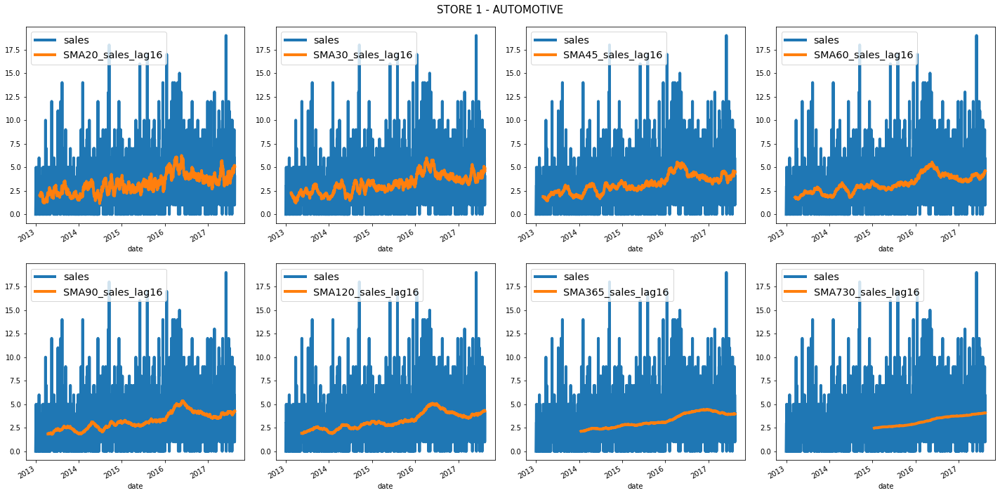

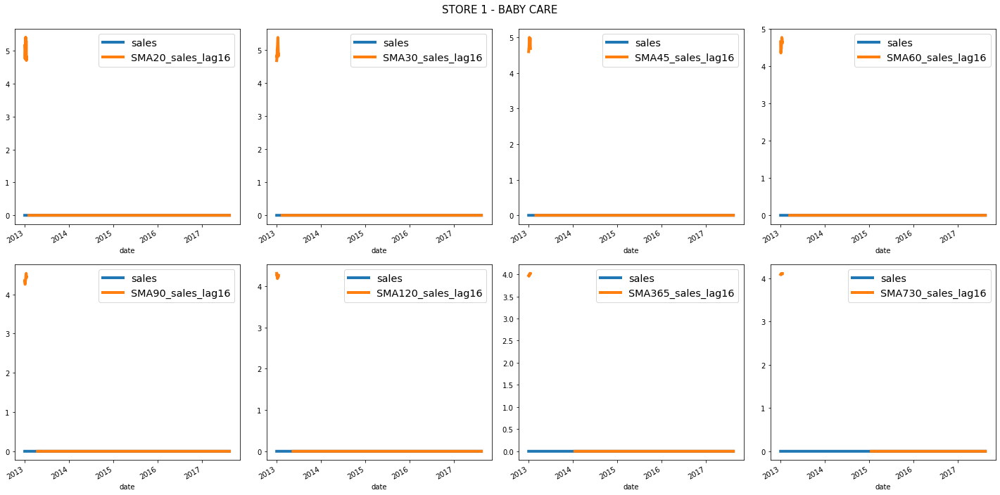

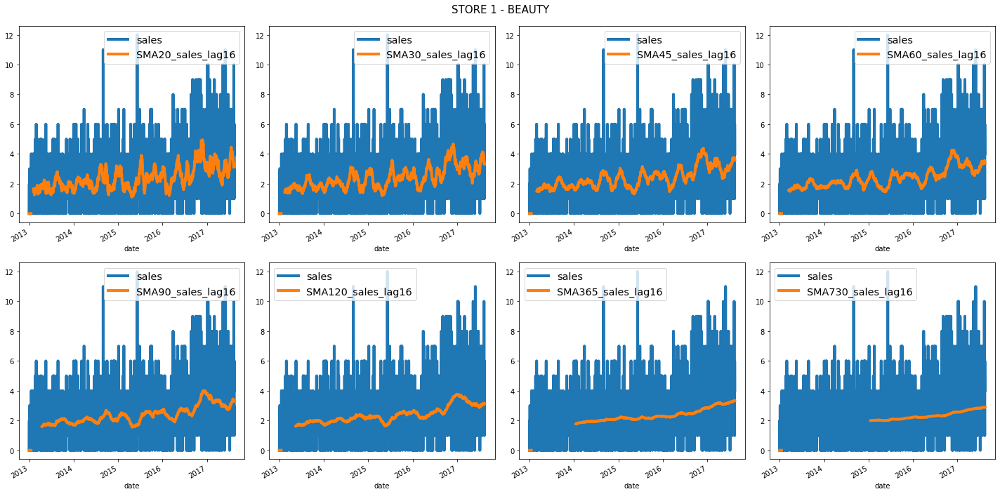

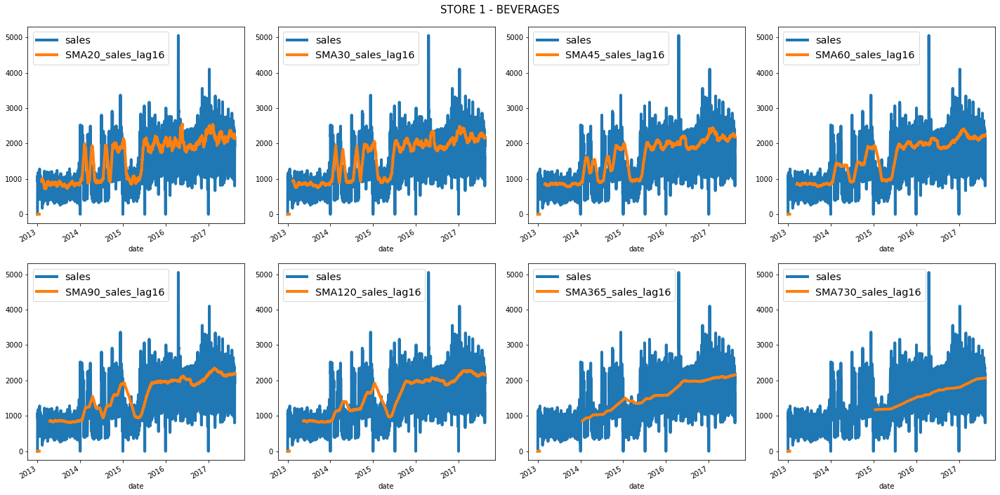

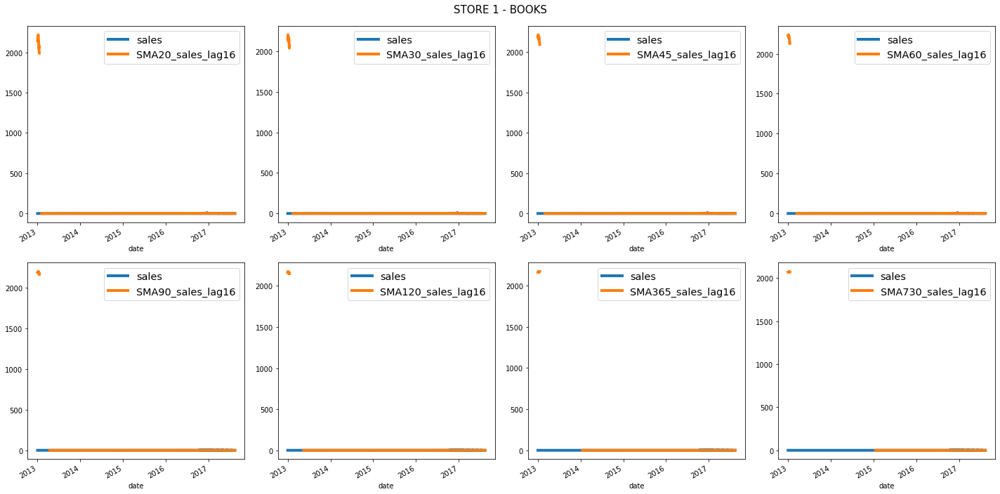

...

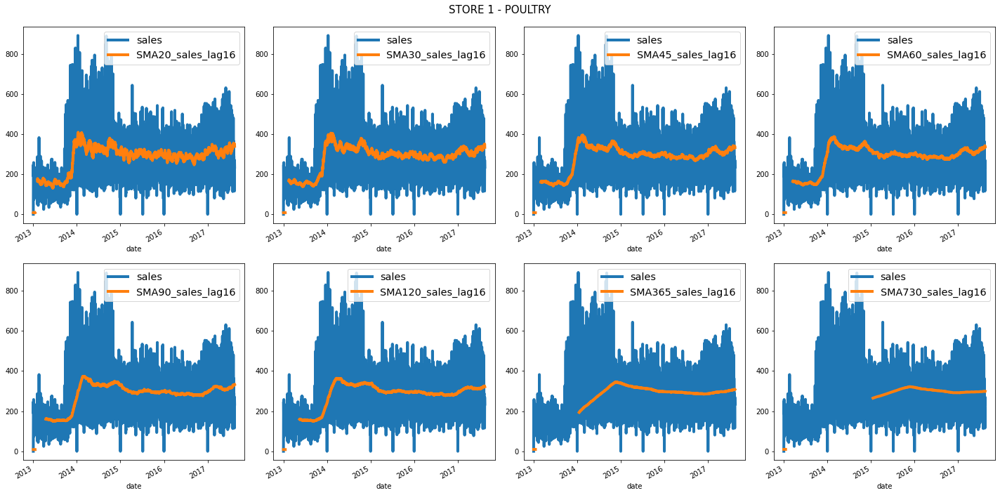

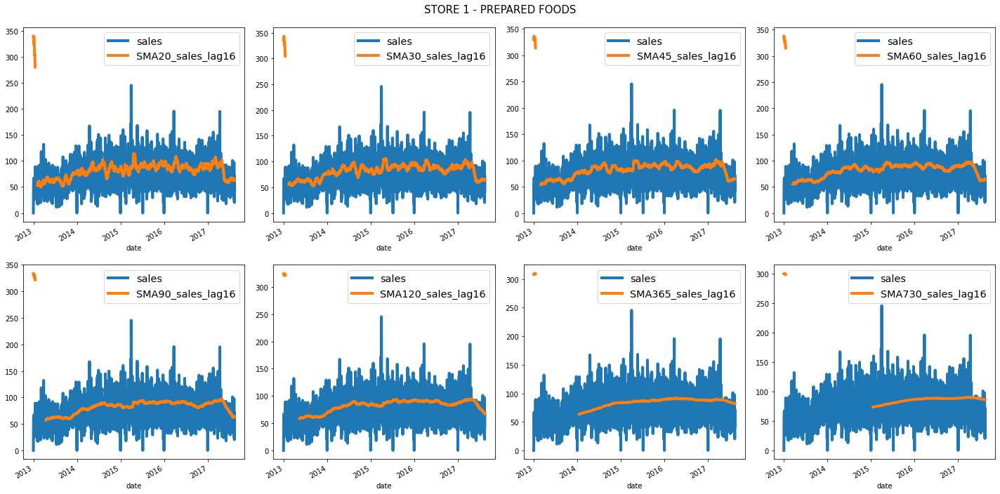

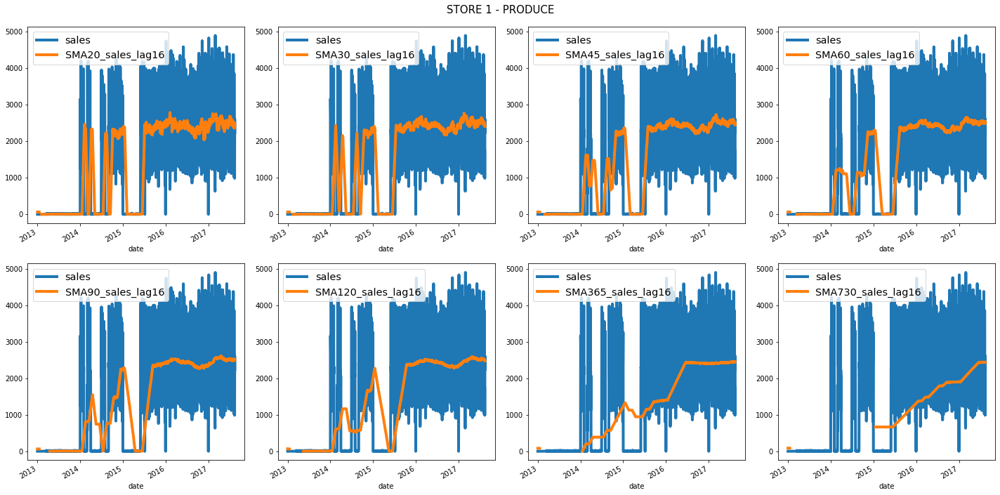

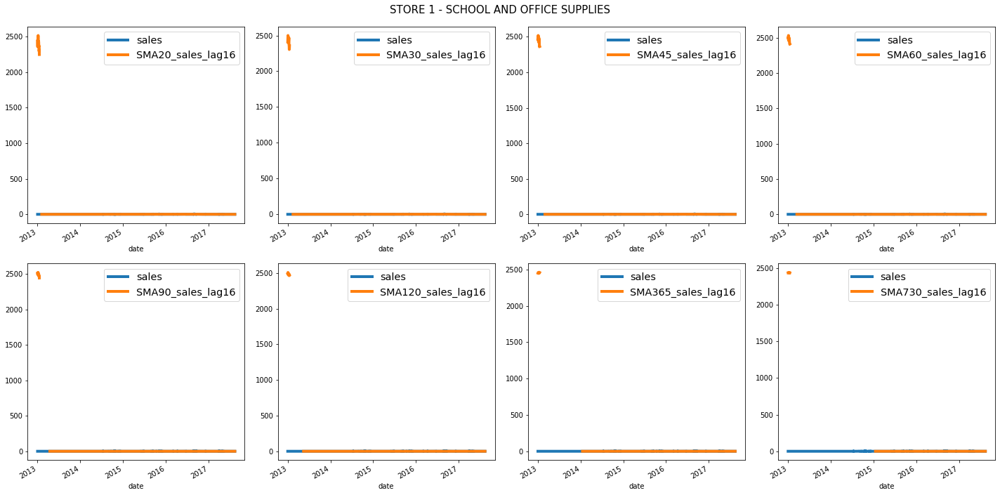

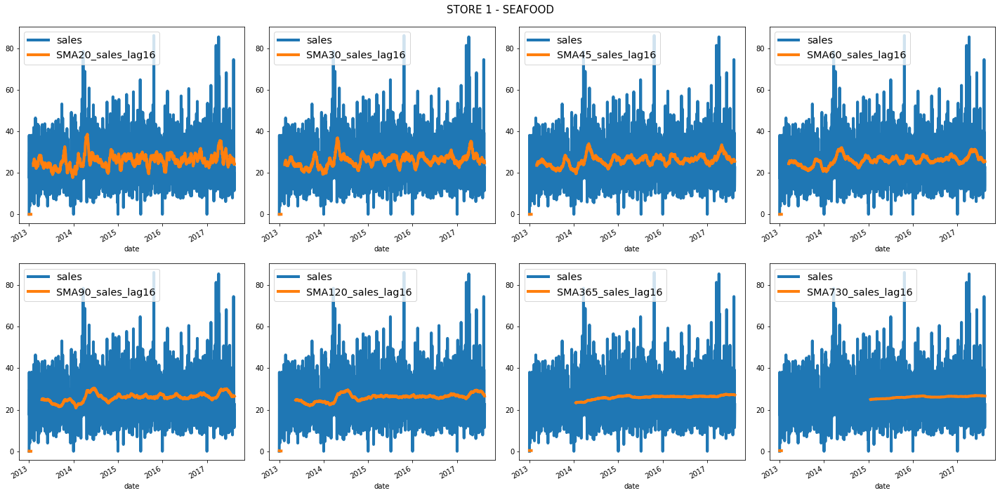

In [ ]:
b = a[(a.store_nbr == 1)].set_index("date")
for i in b.family.unique():
    fig, ax = plt.subplots(2,4,figsize=(20,10))
    b[b.family == i][["sales", "SMA20_sales_lag16"]].plot(legend = True, ax = ax[0,0], linewidth = 4)
    b[b.family == i][["sales", "SMA30_sales_lag16"]].plot(legend = True, ax = ax[0,1], linewidth = 4)
    b[b.family == i][["sales", "SMA45_sales_lag16"]].plot(legend = True, ax = ax[0,2], linewidth = 4)
    b[b.family == i][["sales", "SMA60_sales_lag16"]].plot(legend = True, ax = ax[0,3], linewidth = 4)
    b[b.family == i][["sales", "SMA90_sales_lag16"]].plot(legend = True, ax = ax[1,0], linewidth = 4)
    b[b.family == i][["sales", "SMA120_sales_lag16"]].plot(legend = True, ax = ax[1,1], linewidth = 4)
    b[b.family == i][["sales", "SMA365_sales_lag16"]].plot(legend = True, ax = ax[1,2], linewidth = 4)
    b[b.family == i][["sales", "SMA730_sales_lag16"]].plot(legend = True, ax = ax[1,3], linewidth = 4)
    plt.suptitle("STORE 1 - "+i, fontsize = 15)
    plt.tight_layout(pad = 1.5)
    for j in range(0,4):
        ax[0,j].legend(fontsize="x-large")
        ax[1,j].legend(fontsize="x-large")
    plt.show()

In [ ]:
def ewm_features(dataframe, alphas, lags):
    dataframe = dataframe.copy()
    for alpha in alphas:
        for lag in lags:
            dataframe['sales_ewm_alpha_' + str(alpha).replace(".", "") + "_lag_" + str(lag)] = \
                dataframe.groupby(["store_nbr", "family"])['sales']. \
                    transform(lambda x: x.shift(lag).ewm(alpha=alpha).mean())
    return dataframe

alphas = [0.95, 0.9, 0.8, 0.7, 0.5]
lags = [16, 30, 60, 90]

a = ewm_features(a, alphas, lags)